# Programming Project #1: Hybrid Images

## CS445: Computational Photography - Fall 2019

### Part I: Hybrid Images

In [1]:
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy import signal

import utils

In [2]:
%matplotlib notebook

In [3]:
im1_file = './2.png'
im2_file = './1.png'

im1 = cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE)

<IPython.core.display.Javascript object>


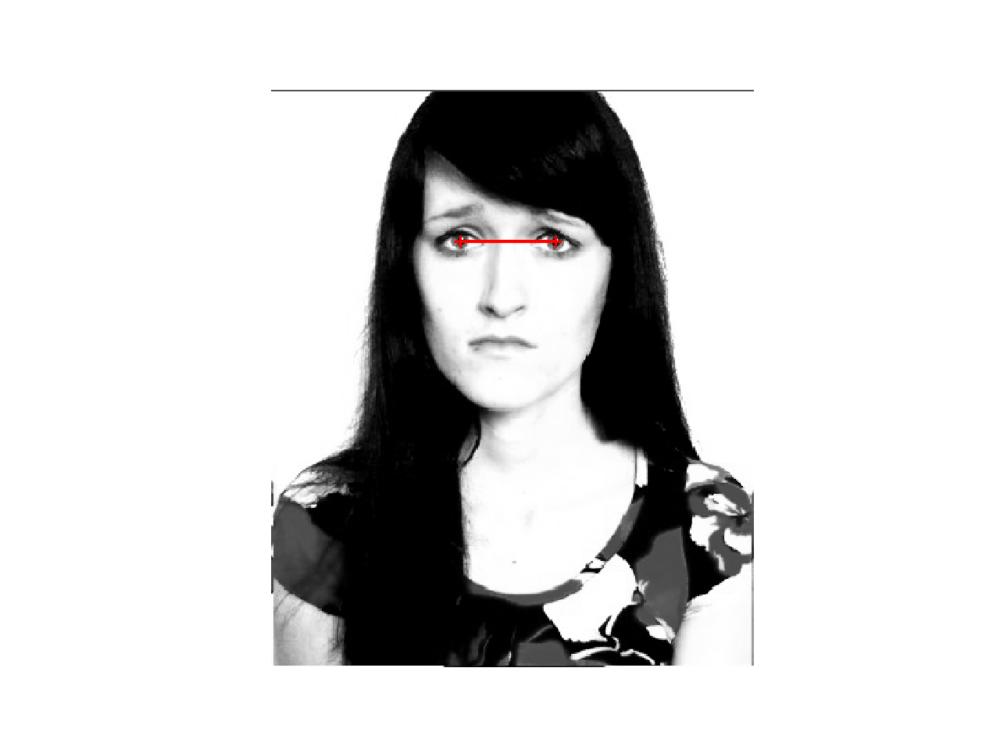

In [7]:
pts_im1 = utils.prompt_eye_selection(im1)

<IPython.core.display.Javascript object>


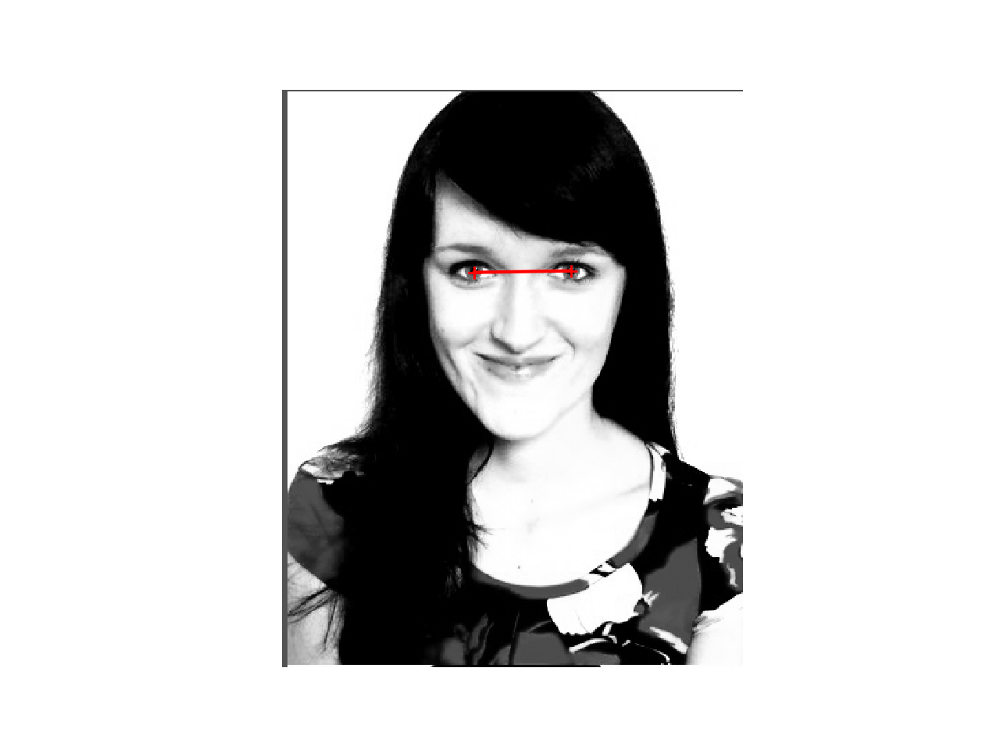

In [8]:
pts_im2 = utils.prompt_eye_selection(im2)

In [9]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)

In [10]:
# convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


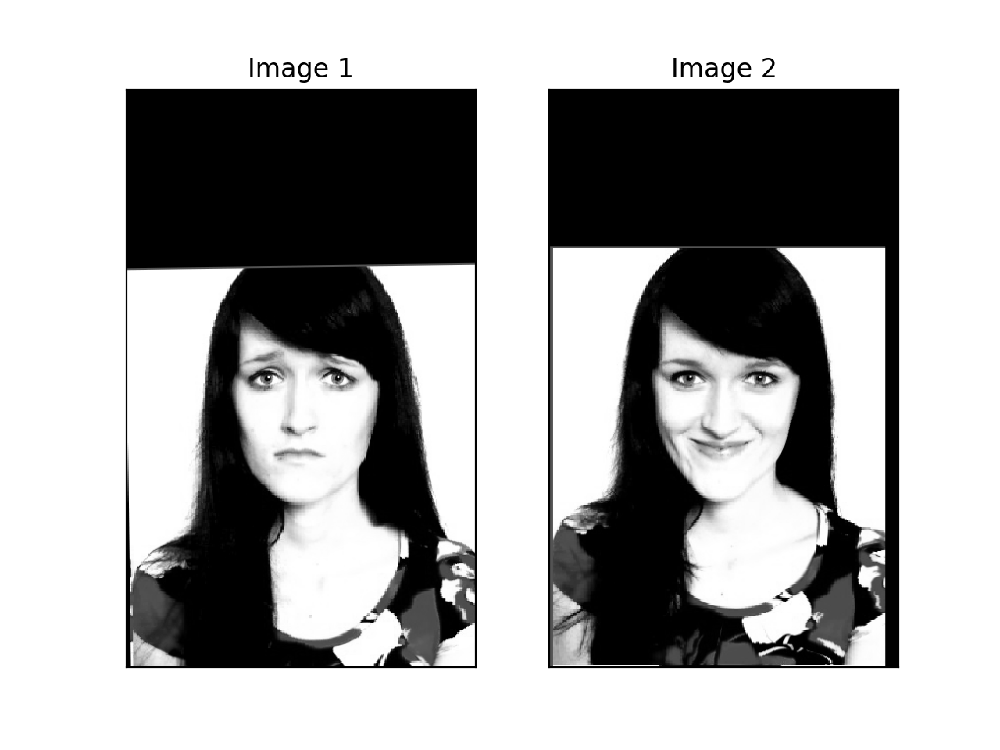

In [11]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [12]:
def hybridImage(im1, im2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''    
    
    low_filter = utils.gaussian_kernel(cutoff_low, 50)
    
    low_pass = cv2.filter2D(im2, -1, low_filter)
    

    
    high_filter = utils.gaussian_kernel(cutoff_high, 50)
    #high_filter = np.ones((21, 21))-high_filter
    

    high_pass = cv2.filter2D(im1, -1, high_filter)
    high_pass = im1 - high_pass
    #plt.imshow(high_pass, cmap='gray')
    
    
    
    return high_pass, low_pass


In [13]:
arbitrary_value = 20  # you should choose meaningful values; you might want to set to a fraction of image size
cutoff_low = 4
cutoff_high = 3

high_pass, low_pass = hybridImage(im1, im2, cutoff_low, cutoff_high)

im_hybrid = high_pass*0.4+low_pass*0.6



<IPython.core.display.Javascript object>


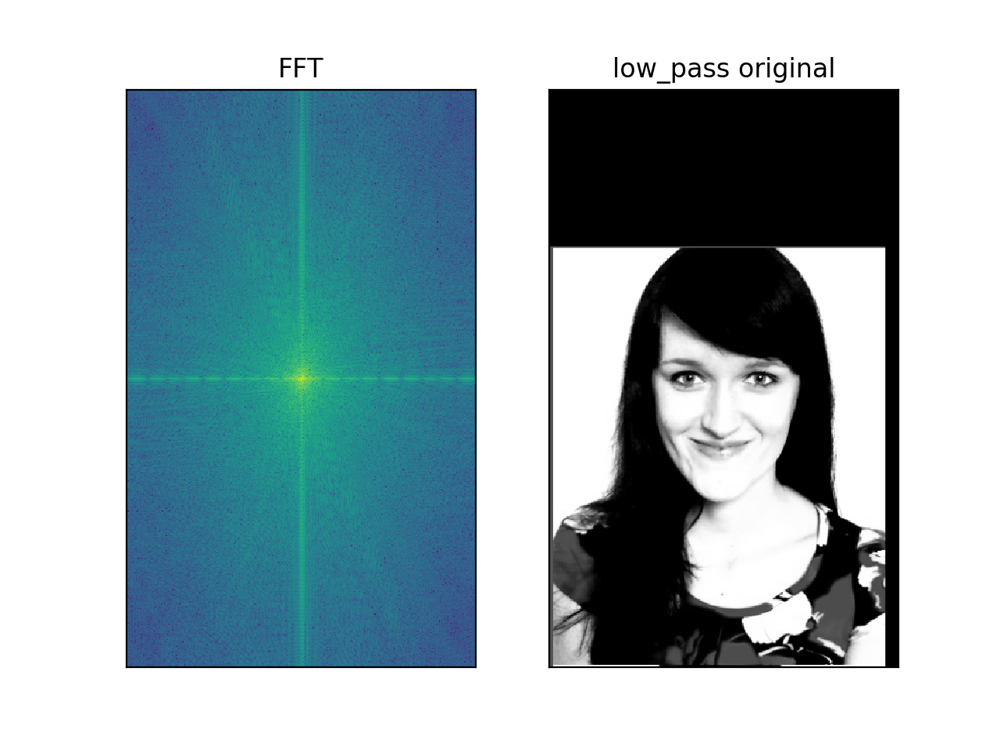

(Text(0.5,1,'low_pass original'), [], [])

In [14]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
axes[0].set_title('FFT'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('low_pass original'), axes[1].set_xticks([]), axes[1].set_yticks([])

<IPython.core.display.Javascript object>


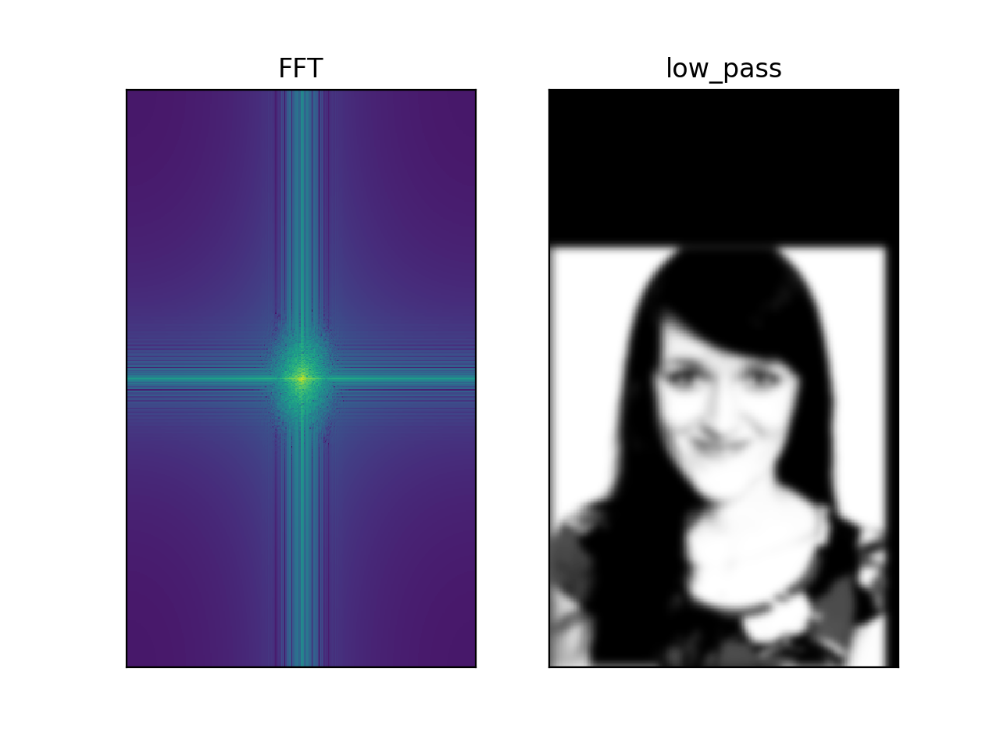

(Text(0.5,1,'low_pass'), [], [])

In [15]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_pass)))))
axes[0].set_title('FFT'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(low_pass,cmap='gray')
axes[1].set_title('low_pass'), axes[1].set_xticks([]), axes[1].set_yticks([])

<IPython.core.display.Javascript object>


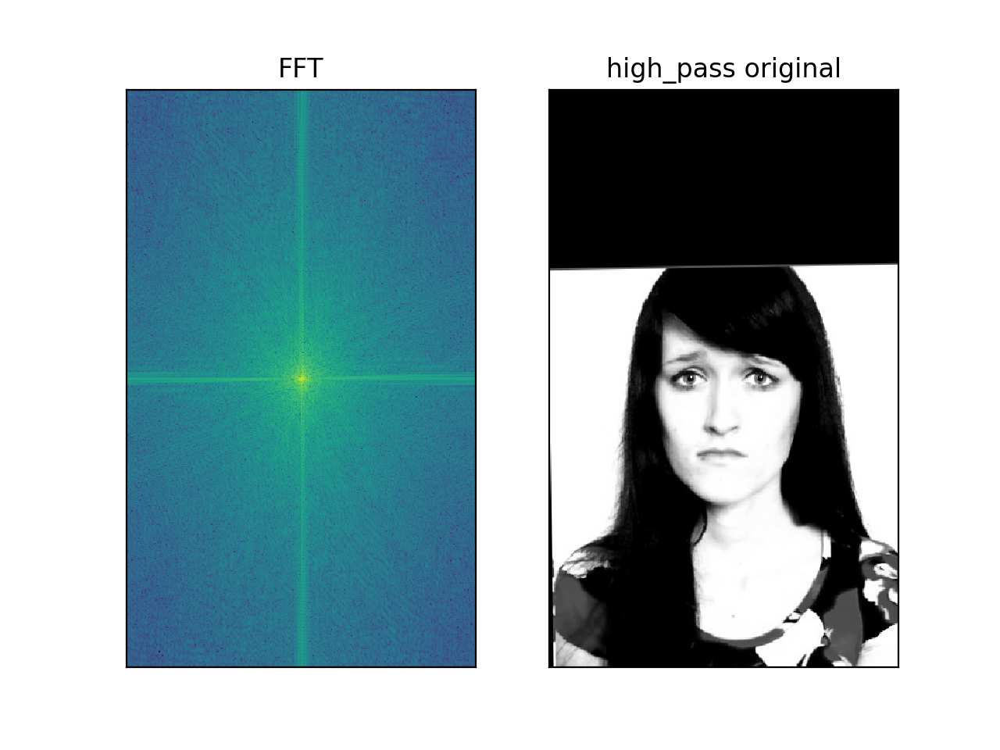

(Text(0.5,1,'high_pass original'), [], [])

In [16]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1)))))
axes[0].set_title('FFT'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im1,cmap='gray')
axes[1].set_title('high_pass original'), axes[1].set_xticks([]), axes[1].set_yticks([])

<IPython.core.display.Javascript object>


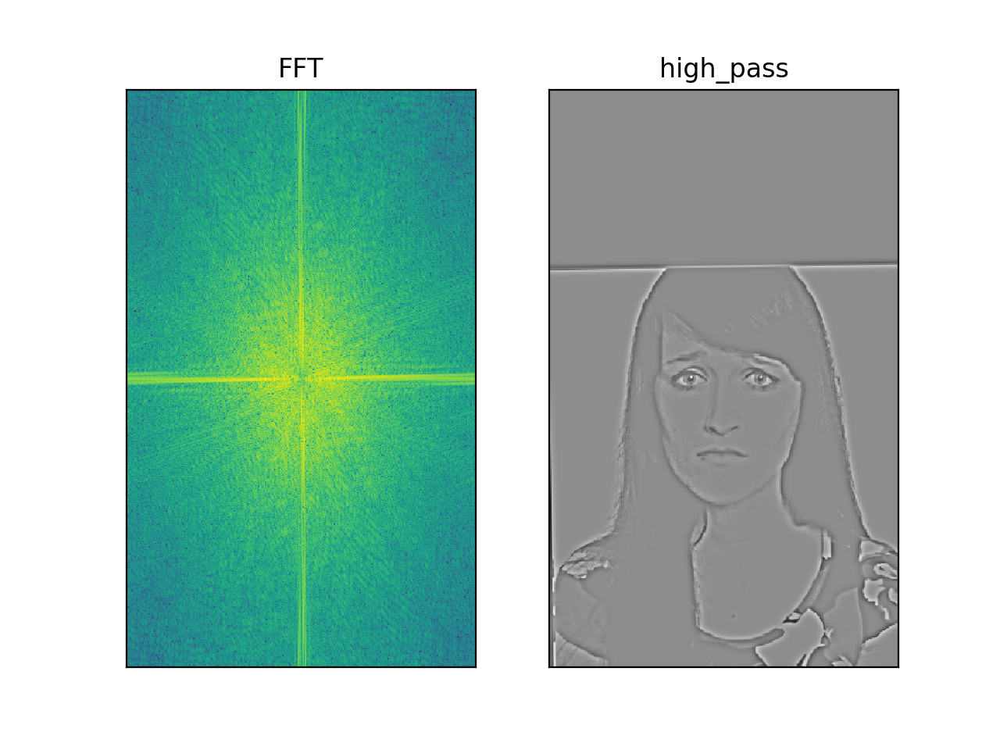

(Text(0.5,1,'high_pass'), [], [])

In [17]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_pass)))))
axes[0].set_title('FFT'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(high_pass,cmap='gray')
axes[1].set_title('high_pass'), axes[1].set_xticks([]), axes[1].set_yticks([])

<IPython.core.display.Javascript object>


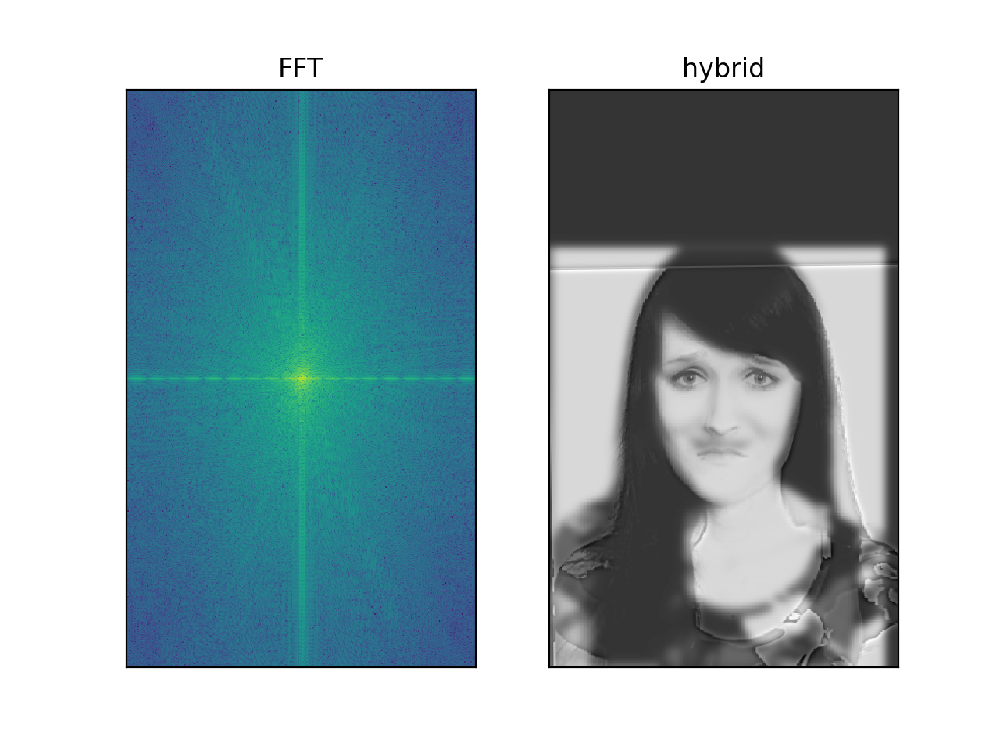

(Text(0.5,1,'hybrid'), [], [])

In [18]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
axes[0].set_title('FFT'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im_hybrid,cmap='gray')
axes[1].set_title('hybrid'), axes[1].set_xticks([]), axes[1].set_yticks([])
#plt.imshow(im_hybrid, cmap='gray')

<IPython.core.display.Javascript object>


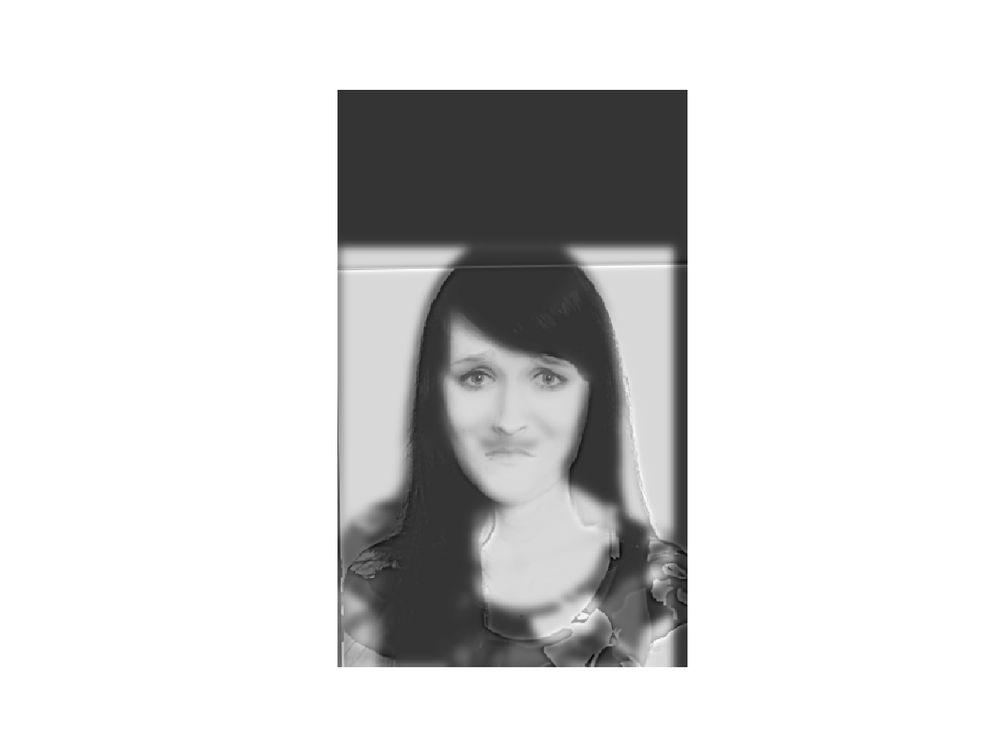

In [19]:
# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(im_hybrid)

In [20]:
im3_file = './2.png'
im4_file = './3.png'

im3 = cv2.imread(im3_file)
im4 = cv2.imread(im4_file)

<IPython.core.display.Javascript object>


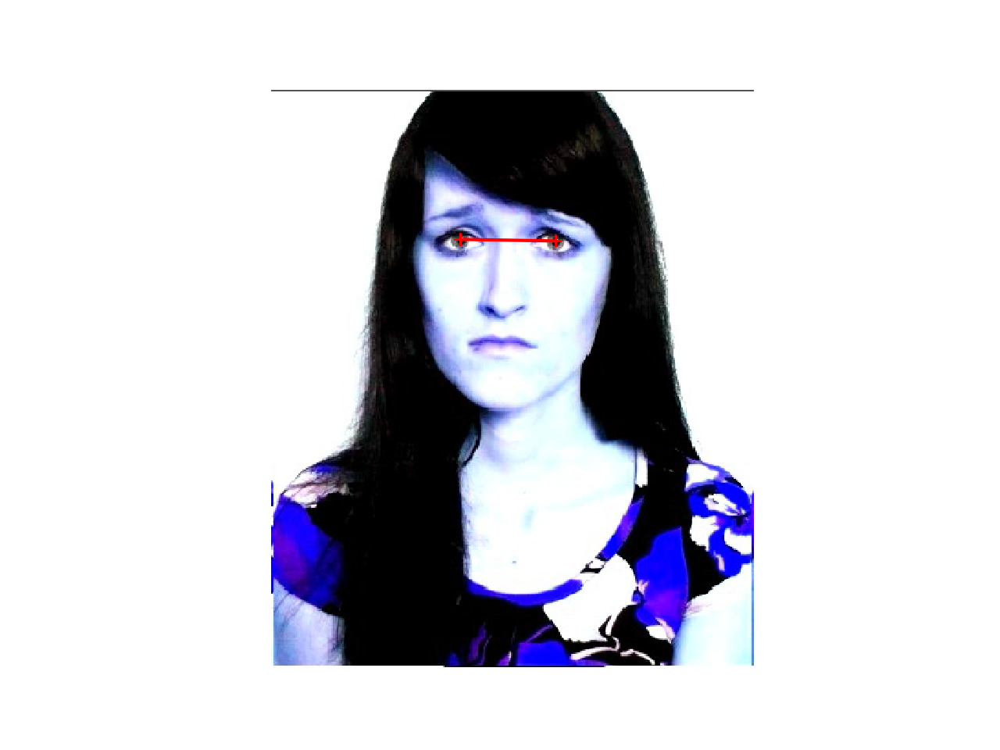

In [21]:
pts_im3 = utils.prompt_eye_selection(im3)

<IPython.core.display.Javascript object>


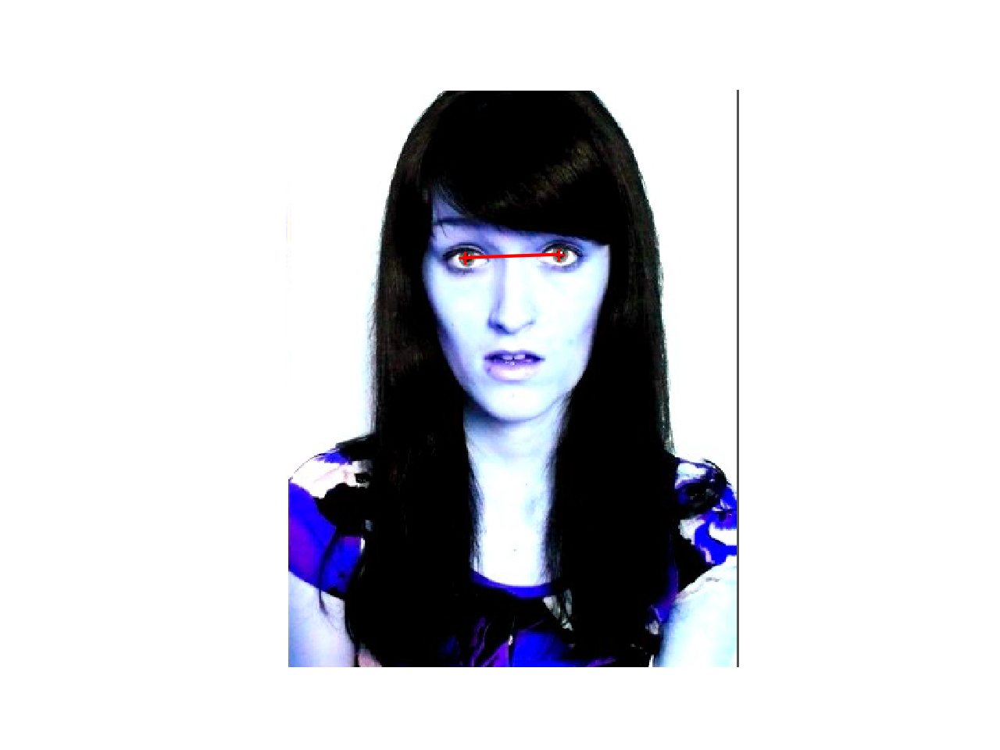

In [22]:
pts_im4 = utils.prompt_eye_selection(im4)

In [23]:
im3, im4 = utils.align_images(im3_file, im4_file,pts_im3,pts_im4,save_images=False)

In [24]:
im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2RGB)
im4 = cv2.cvtColor(im4, cv2.COLOR_BGR2RGB)
#im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


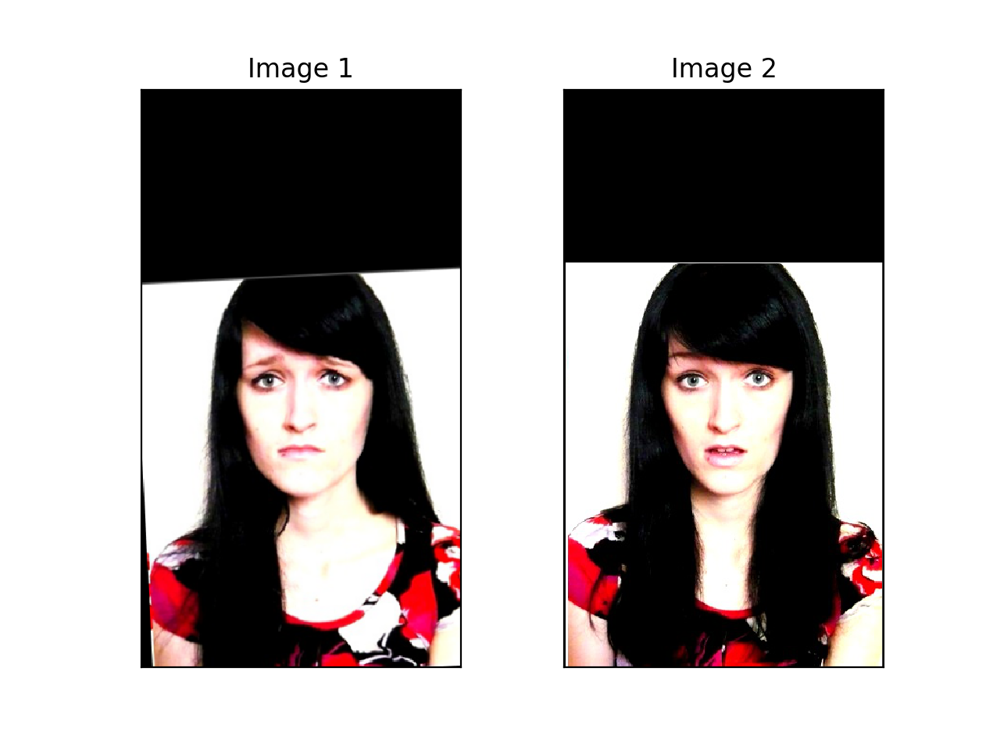

In [25]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im3)
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im4)
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [26]:
high_pass1 = im3.copy()
low_pass1 = im4.copy()

high_pass1[:,:,0], low_pass1[:,:,0] = hybridImage(im3[:,:,0], im4[:,:,0], 4, 1000)
high_pass1[:,:,1], low_pass1[:,:,1] = hybridImage(im3[:,:,1], im4[:,:,1], 4, 1000)
high_pass1[:,:,2], low_pass1[:,:,2] = hybridImage(im3[:,:,2], im4[:,:,2], 4, 1000)

#high_pass1, low_pass1[:,:,0] = hybridImage(im3, im4[:,:,0], 4, 100)
#high_pass1, low_pass1[:,:,1] = hybridImage(im3, im4[:,:,1], 4, 100)
#high_pass1, low_pass1[:,:,2] = hybridImage(im3, im4[:,:,2], 4, 100)
im_hybrid2 = low_pass1.copy()

im_hybrid2[:,:,0] = high_pass1[:,:,2]*0.2+low_pass1[:,:,0]*0.8
im_hybrid2[:,:,1] = high_pass1[:,:,2]*0.2+low_pass1[:,:,1]*0.8
im_hybrid2[:,:,2] = high_pass1[:,:,2]*0.2+low_pass1[:,:,2]*0.8

<IPython.core.display.Javascript object>


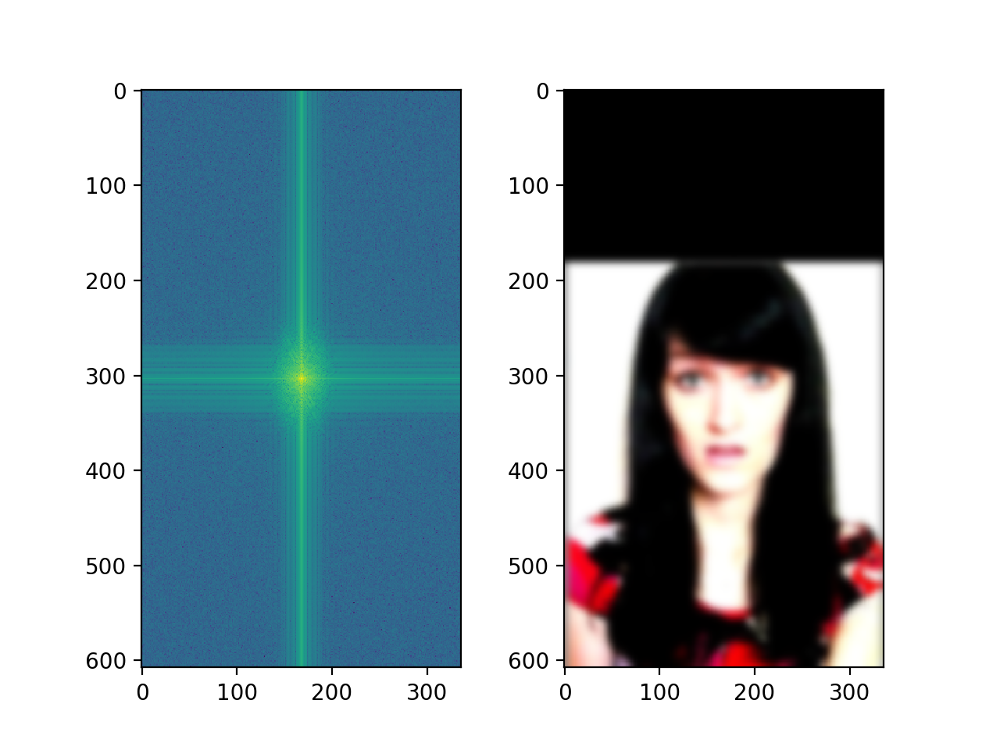

In [27]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(low_pass1, cv2.COLOR_BGR2GRAY))))))
axes[1].imshow(low_pass1)

<IPython.core.display.Javascript object>


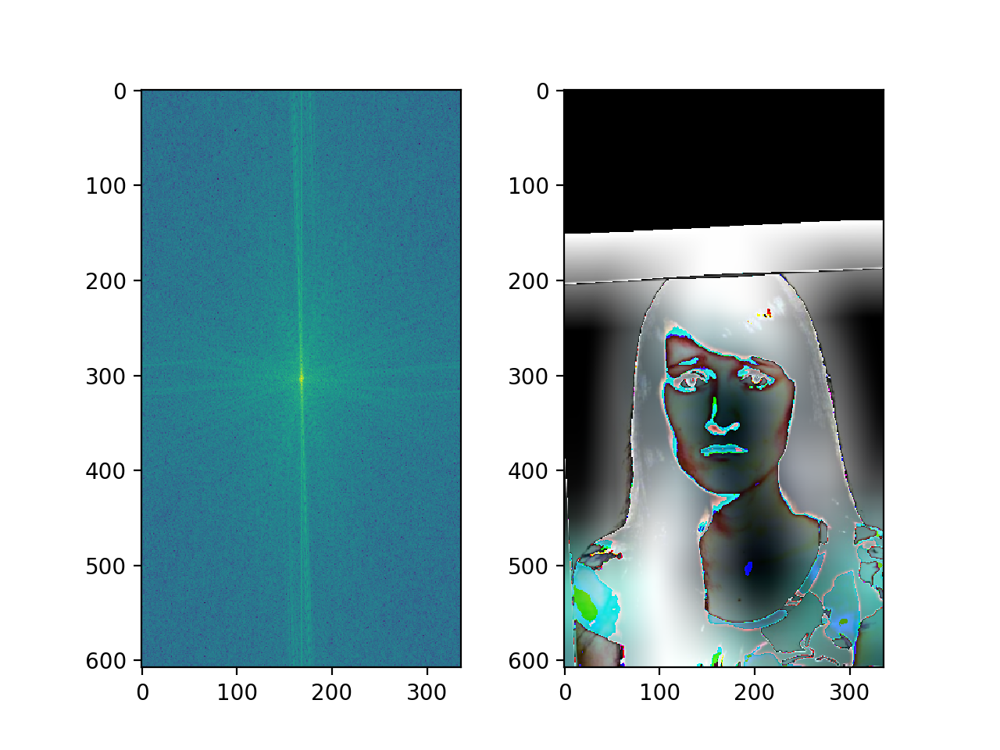

In [28]:
fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(high_pass1, cv2.COLOR_BGR2GRAY))))))
axes[1].imshow(high_pass1, cmap='gray')

<IPython.core.display.Javascript object>


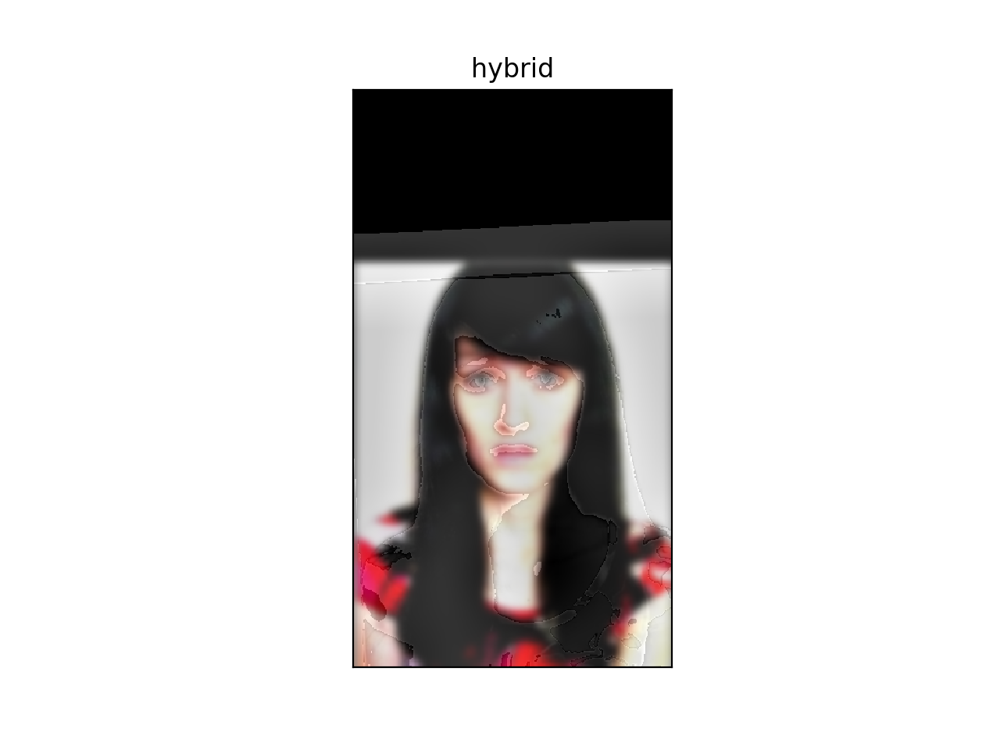

(Text(0.5,1,'hybrid'), [], [])

In [29]:
fig, axes = plt.subplots(1, 1)
axes.imshow(im_hybrid2)
axes.set_title('hybrid'), axes.set_xticks([]), axes.set_yticks([])
#plt.imshow(im_hybrid, cmap='gray')

<IPython.core.display.Javascript object>


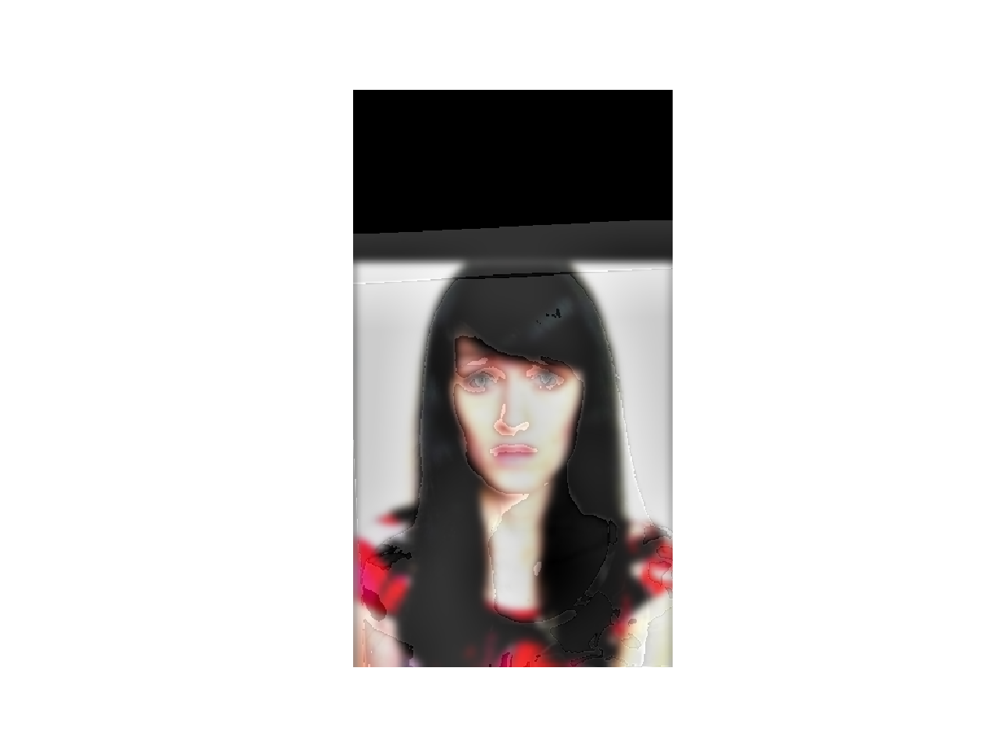

In [30]:
# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(im_hybrid2)

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

<IPython.core.display.Javascript object>


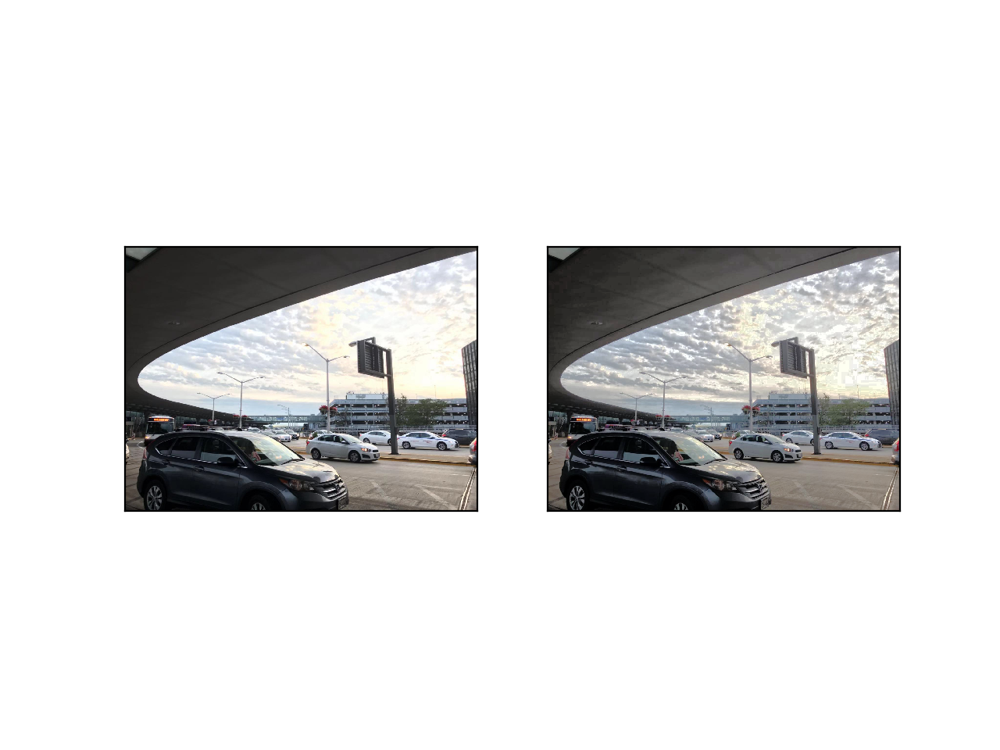

([], [])

In [31]:
img = cv2.imread("./6.jpeg")
img_hist = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_hist[:,:,2] = cv2.equalizeHist(img_hist[:,:,2])
img_hist = cv2.cvtColor(img_hist, cv2.COLOR_HSV2RGB)
fig, axes = plt.subplots(1, 2)
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(img_hist)
axes[1].set_xticks([]), axes[1].set_yticks([])

#### Color enhancement 

<IPython.core.display.Javascript object>


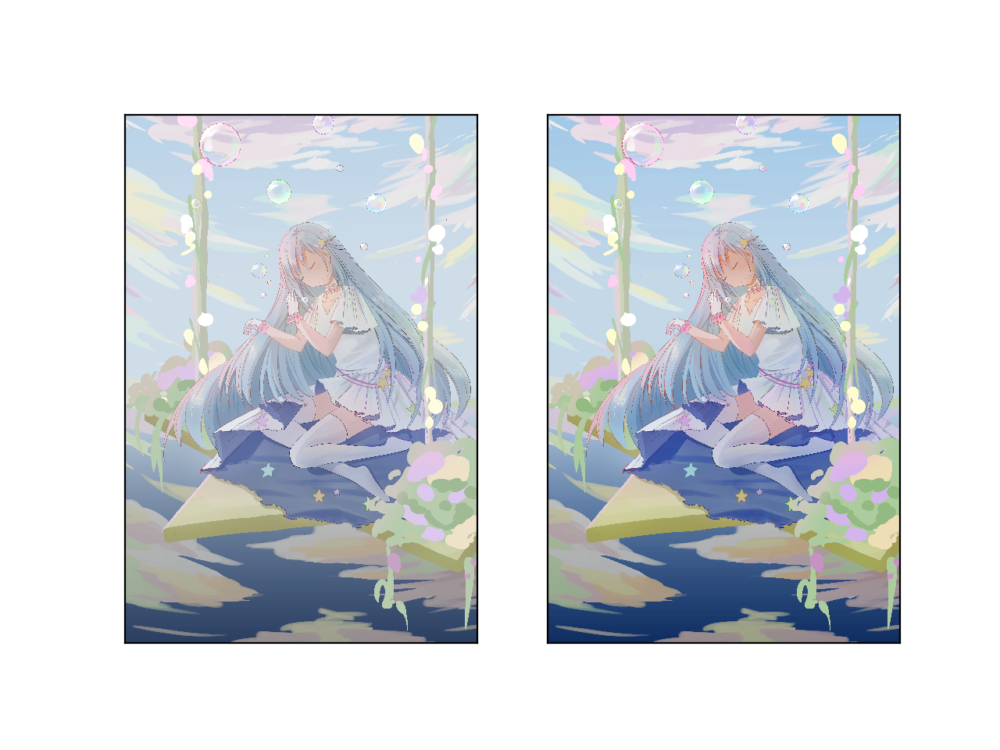

([], [])

In [32]:
img = cv2.imread("9.png")
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_hsv[:,:,1] = img_hsv[:,:,1]*1.5
img_hsv[:,:,1][img_hsv[:,:,1] > 255] = 255
fig, axes = plt.subplots(1, 2)
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
axes[1].set_xticks([]), axes[1].set_yticks([])

#### Color shift

<IPython.core.display.Javascript object>


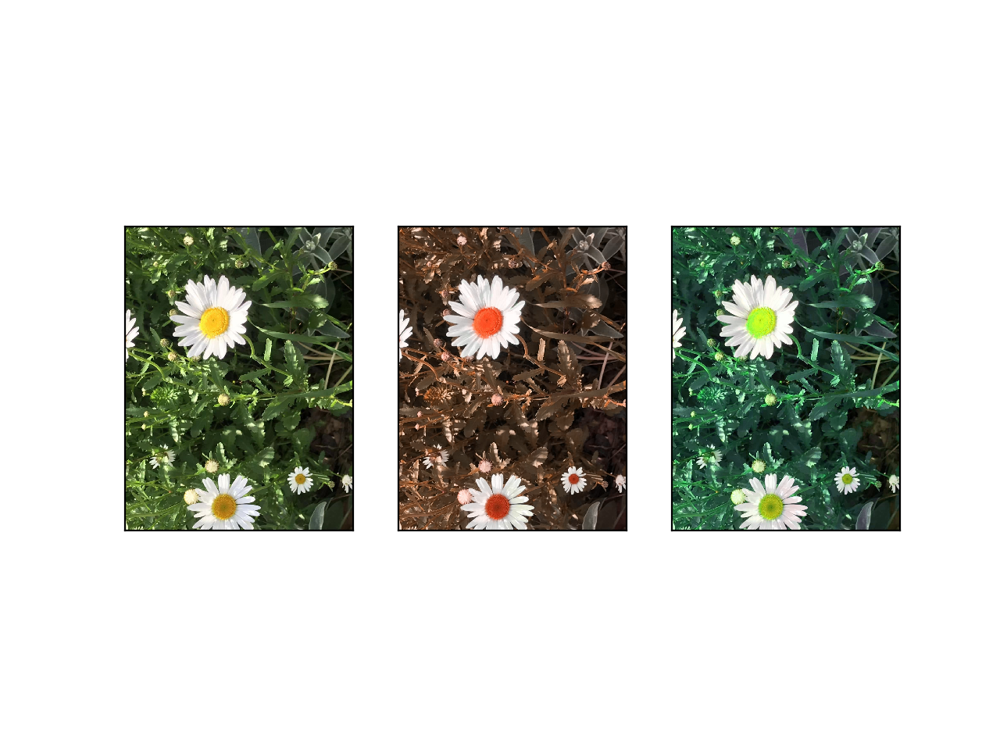

([], [])

In [33]:
img = cv2.imread("./7.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_red = img.copy()
img_yellow = img.copy()
img_red[:,:,0] = img_red[:,:,0]*0.3
img_yellow[:,:,0] = img_yellow[:,:,0]*1.7
img_yellow[:,:,0][img_yellow[:,:,0] > 180] = 180
fig, axes = plt.subplots(1, 3)
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_HSV2RGB))
axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(cv2.cvtColor(img_red, cv2.COLOR_HSV2RGB))
axes[1].set_xticks([]), axes[1].set_yticks([])
axes[2].imshow(cv2.cvtColor(img_yellow, cv2.COLOR_HSV2RGB))
axes[2].set_xticks([]), axes[2].set_yticks([])